# **Objetivo del proyecto**

Le han solicitado que ayude a las autoridades locales a hacer la planeación de la atención y prevención de los accidentes de tránsito en la ciudad de Medellin, para lo cual le han suministrado los datos de los accidentes de tránsito que se han presentado en el periodo 2014-2020.

Se espera que informe:
1. Dónde ubicar:
*   los agentes de tránsito
*   las ambulancias
2. Los horarios y el personal qué debe estar disponible para atender los eventos. Teniendo en cuenta en qué horarios, días y fechas particulares se presentan mayor accidentalidad y de qué tipo.
3. Se espera que tenga en cuenta los años y la estacionalidad al momento de analizar la accidentalidad.
4. Recomendaciones para prevenir los accidentes de tránsito.


# 0 - Librerías necesarias


In [183]:
!pip install folium
!pip install googlemaps
import datetime
from google.colab import drive
drive.mount('/content/drive')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score
from scipy.cluster.hierarchy import dendrogram, linkage
import folium
from folium.plugins import HeatMap
import warnings
from sklearn.utils import resample
from sklearn.neighbors import NearestNeighbors
from scipy.spatial.distance import cdist
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# 1 - Preprocesamiento de los datos

In [ ]:
# Carga inicial del dataset y revisión general antes de limpiar.
dataset = pd.read_excel ('/content/drive/MyDrive/Colab Notebooks/No supervisado/Workshops/Parcial 1 - Incidentes Tránsito/Incidentes2014_2020.xlsx')
dataset

,NRO_RADICADO,Latitud,Longitud,CLASE_ACCIDENTE,DIRECCION,CBML,Gravedad Incidente,nombre comuna,Barrio,Diseño,Año,FECHA_ACCIDENTE,HORA_ACCIDENTE,codigo comuna,Comuna
0,1423828,6.219016,-75.602726,Choque,CR 80 CL 8,1611,Con heridos,Belén,Loma de los Bernal,Tramo de via,2014,2014-01-01,02:20:00,16,16 - Belén
1,1423839,6.260009,-75.568185,Atropello,CR 53 CL 61,1003,Con heridos,La Candelaria,Jesús Nazareno,Tramo de via,2014,2014-01-01,00:50:00,10,10 - La Candelaria
2,1423840,6.264765,-75.549943,Atropello,CR 39 CL 70,0308,Con heridos,Manrique,Manrique Oriental,Tramo de via,2014,2014-01-01,01:00:00,3,03 - Manrique
3,1423849,6.234327,-75.607611,Atropello,CL 32 CR 84,1617,Con heridos,Belén,Las Mercedes,Tramo de via,2014,2014-01-01,00:37:00,16,16 - Belén
4,1423890,6.300243,-75.579644,Caida Ocupante,CR 80 CL 101,0603,Con heridos,Doce De Octubre,Doce de Octubre No.2,Tramo de via,2014,2014-01-01,10:40:00,6,06 - Doce de Octubre
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
288978,1717678,6.220716,-75.559017,Caida Ocupante,CL 19A CR 27,9004,Con heridos,Corregimiento De Santa Elena,9004,Lote o Predio,2020,2020-06-30,21:00:00,90,90 - Corregimiento de Santa Elena
288979,1717650,6.286417,-75.570338,Choque,CR 65 CL 94,0511,Con heridos,Castilla,Castilla,Interseccion,2020,2020-06-30,21:05:00,5,05 - Castilla
288980,1717526,6.221415,-75.703776,Choque,CR 86 CL 44 B Sur,1204,Con heridos,La América,La América,Tramo de via,2020,2020-06-30,21:15:00,12,12 - La América
288981,1717545,6.235761,-75.538379,Otro,CR 12 CL 53,0813,Con heridos,Villa Hermosa,Villatina,Lote o Predio,2020,2020-06-30,22:00:00,8,08 - Villa Hermosa


In [ ]:
print(dataset.shape)
dataset.info()
dataset.head()

(288983, 15)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 288983 entries, 0 to 288982
Data columns (total 15 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   NRO_RADICADO        288980 non-null  object        
 1   Latitud             288449 non-null  float64       
 2   Longitud            288449 non-null  float64       
 3   CLASE_ACCIDENTE     288976 non-null  object        
 4   DIRECCION           288983 non-null  object        
 5   CBML                266383 non-null  object        
 6   Gravedad Incidente  288983 non-null  object        
 7   nombre comuna       288983 non-null  object        
 8   Barrio              265511 non-null  object        
 9   Diseño              288198 non-null  object        
 10  Año                 288983 non-null  int64         
 11  FECHA_ACCIDENTE     288983 non-null  datetime64[ns]
 12  HORA_ACCIDENTE      288983 non-null  object        
 13  codigo comuna   

,NRO_RADICADO,Latitud,Longitud,CLASE_ACCIDENTE,DIRECCION,CBML,Gravedad Incidente,nombre comuna,Barrio,Diseño,Año,FECHA_ACCIDENTE,HORA_ACCIDENTE,codigo comuna,Comuna
0,1423828,6.219016,-75.602726,Choque,CR 80 CL 8,1611,Con heridos,Belén,Loma de los Bernal,Tramo de via,2014,2014-01-01,02:20:00,16,16 - Belén
1,1423839,6.260009,-75.568185,Atropello,CR 53 CL 61,1003,Con heridos,La Candelaria,Jesús Nazareno,Tramo de via,2014,2014-01-01,00:50:00,10,10 - La Candelaria
2,1423840,6.264765,-75.549943,Atropello,CR 39 CL 70,0308,Con heridos,Manrique,Manrique Oriental,Tramo de via,2014,2014-01-01,01:00:00,3,03 - Manrique
3,1423849,6.234327,-75.607611,Atropello,CL 32 CR 84,1617,Con heridos,Belén,Las Mercedes,Tramo de via,2014,2014-01-01,00:37:00,16,16 - Belén
4,1423890,6.300243,-75.579644,Caida Ocupante,CR 80 CL 101,0603,Con heridos,Doce De Octubre,Doce de Octubre No.2,Tramo de via,2014,2014-01-01,10:40:00,6,06 - Doce de Octubre


## 1.1 - Limpieza de los datos

## 1.1.1 - Eliminación de variables

Por ahora no contemplo eliminar ningún dato puesto a que todos pueden brindarme ayuda y valor a la hora del análisis.

In [ ]:
# Se revisan nulos, duplicados y consistencia de texto antes de transformar variables.
print(dataset.isnull().sum()) # Verificamos filas vacías en el dataset por cada columna

NRO_RADICADO              3
Latitud                 534
Longitud                534
CLASE_ACCIDENTE           7
DIRECCION                 0
CBML                  22600
Gravedad Incidente        0
nombre comuna             0
Barrio                23472
Diseño                  785
Año                       0
FECHA_ACCIDENTE           0
HORA_ACCIDENTE            0
codigo comuna             0
Comuna                    0
dtype: int64


In [ ]:
print(dataset.duplicated(subset='NRO_RADICADO').sum()) # Verificamos duplicados en 'NRO_RADICADO'
# Verificamos que tenemos solamente 2 duplicados.

2


In [ ]:
dup_ids = dataset[dataset.duplicated(subset='NRO_RADICADO', keep=False)]
dup_ids.sort_values('NRO_RADICADO')
# Vemos que estos casos están faltos de un identificador en 'NRO_RADICADO'. Añadamos un identificador único para cada uno de estos casos.

,NRO_RADICADO,Latitud,Longitud,CLASE_ACCIDENTE,DIRECCION,CBML,Gravedad Incidente,nombre comuna,Barrio,Diseño,Año,FECHA_ACCIDENTE,HORA_ACCIDENTE,codigo comuna,Comuna
281193,NaN,6.269275,-75.591757,Choque,CL 60 CR 77,0703,Solo daños,Robledo,Caribe,NaN,2020,2020-02-27,13:55:00,7,07 - Robledo
281328,NaN,6.231842,-75.606288,Atropello,CL 30 A CR 83,1615,Con heridos,Belén,Los Alpes,NaN,2020,2020-02-28,12:10:00,16,16 - Belén
281490,NaN,6.249793,-75.568645,Atropello,CL 50 CR 51,1019,Con heridos,La Candelaria,La Candelaria,NaN,2020,2020-02-29,15:17:00,10,10 - La Candelaria


In [ ]:
# Ver tipos únicos presentes
dataset['NRO_RADICADO'].apply(type).value_counts()

,count
NRO_RADICADO,
<class 'str'>,145220
<class 'int'>,143760
<class 'float'>,3


In [ ]:
# Forzar conversión a numérico
dataset['NRO_RADICADO'] = pd.to_numeric(dataset['NRO_RADICADO'], errors='coerce')

In [ ]:
dataset['NRO_RADICADO'].max()

5.001600020620141e+19

In [ ]:
dataset['NRO_RADICADO'].sort_values(ascending=False).head(10)

,NRO_RADICADO
6253,5.001600e+19
91631,5.001600e+18
288902,1.717718e+06
288956,1.717717e+06
288938,1.717716e+06
288941,1.717715e+06
288893,1.717714e+06
288931,1.717712e+06
288936,1.717711e+06
288976,1.717710e+06


In [ ]:
# Marcar valores corruptos como nulos también
dataset.loc[dataset['NRO_RADICADO'] > 1e8, 'NRO_RADICADO'] = np.nan

In [ ]:
# Confirmar cuántos nulos hay ahora
dataset['NRO_RADICADO'].isnull().sum()
# 3 Nulos + 2 corruptos

np.int64(5)

In [ ]:
# Reasignar IDs a los nulos
max_id = dataset['NRO_RADICADO'].max()
n_nulos = dataset['NRO_RADICADO'].isnull().sum()

nuevos_ids = list(range(int(max_id) + 1, int(max_id) + 1 + n_nulos))
dataset.loc[dataset['NRO_RADICADO'].isnull(), 'NRO_RADICADO'] = nuevos_ids

In [ ]:
dataset['NRO_RADICADO'].isnull().sum()
# Sin nulos

np.int64(0)

In [ ]:
print(dataset.duplicated(subset='NRO_RADICADO').sum())
# Sin duplicados

0


In [ ]:
dataset['NRO_RADICADO'] = dataset['NRO_RADICADO'].astype('int64')
dataset['NRO_RADICADO'].dtype
# Convertimos a tipo de dato 'int' todos los identificadores únicos en 'NRO_RADICADO'

dtype('int64')

## 1.1.2 - Tratamiento de datos atípicos

## Se revisan coordenadas fuera del rango geográfico de Medellín.


In [ ]:
# Rango aproximado de Medellín
print(dataset['Latitud'].describe())
print(dataset['Longitud'].describe())

count    288449.000000
mean          6.247812
std           0.028609
min           6.152019
25%           6.225593
50%           6.248048
75%           6.268174
max           6.367985
Name: Latitud, dtype: float64
count    288449.000000
mean        -75.586967
std           0.038592
min         -75.703816
25%         -75.593021
50%         -75.576050
75%         -75.566122
max         -75.473437
Name: Longitud, dtype: float64


## Visualizar dispersión de coordenadas


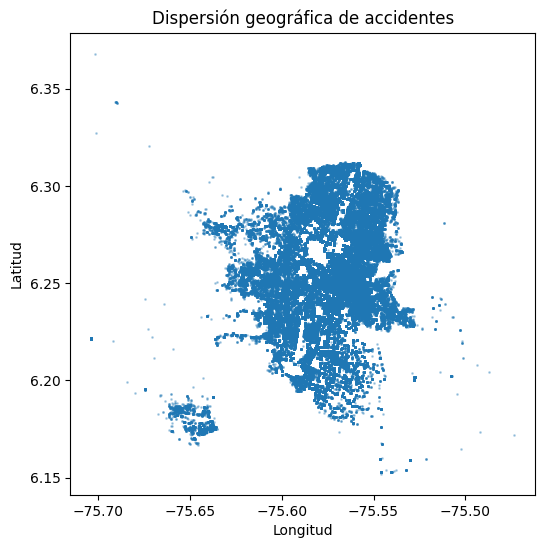

In [ ]:
plt.figure(figsize=(6,6))
plt.scatter(dataset['Longitud'], dataset['Latitud'], s=1, alpha=0.3)
plt.title('Dispersión geográfica de accidentes')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.show()

## 1.1.3 Tratamiento de datos faltantes

In [ ]:
dataset.isnull().sum()

,0
NRO_RADICADO,0
Latitud,534
Longitud,534
CLASE_ACCIDENTE,7
DIRECCION,0
CBML,22600
Gravedad Incidente,0
nombre comuna,0
Barrio,23472
Diseño,785


## Datos nulos de coordenadas

In [ ]:
dataset[['Latitud','Longitud']].isnull().sum()
# Como observamos anteriormente tenemos 534 direcciones sin latitud ni longitud

,0
Latitud,534
Longitud,534


In [ ]:
dataset[dataset['Latitud'].isnull()]['DIRECCION'] # Vemos que para las direcciones sin latitud contamos con una dirección.
# Podríamos pensar en geocodificarlas. Primero veamos los otros componentes de la dirección como 'nombre comuna'

,DIRECCION
209491,CR 55 CL 64
209497,CR 36 CL 92 BB
209515,CR 52 DG 4
209516,CR 50 CL 14 Sur
209523,CR 30 A CL 10
...,...
217036,CR 28 CL 69 BB
217046,Av 80 CL 3 SUR
217048,Vía Las Palmas KM 9 + 210 mts
217054,Ruta 62 - 04A Km 2 + 33


In [ ]:
dataset[dataset['Latitud'].isnull()]['nombre comuna']
# Si bien tenemos nomenclaturas en 'DIRECCION'. No contamos con otros componentes que faciliten pensar en la geocodificación.
# Además, las direcciones faltantes son tan solo 534, un porcentaje poco significativo para la cantidad de datos que tenemos.
# Es por eso que mejor sería eliminar estas filas para tener datos más precisos para eventualmente graficar

,nombre comuna
209491,Sin Inf
209497,Sin Inf
209515,Sin Inf
209516,Sin Inf
209523,Sin Inf
...,...
217036,Sin Inf
217046,Guayabal
217048,Corregimiento De Santa Elena
217054,Corregimiento De San Sebastián De Palmitas


In [ ]:
dataset = dataset.dropna(subset=['Latitud', 'Longitud'])
print(dataset[['Latitud','Longitud']].isnull().sum())

Latitud     0
Longitud    0
dtype: int64


In [ ]:
# Eliminar coordenadas fuera del rango de Medellín (en vez de geocodificar)
dataset = dataset[
    (dataset['Latitud'] >= 6.10) & (dataset['Latitud'] <= 6.40) &
    (dataset['Longitud'] >= -75.75) & (dataset['Longitud'] <= -75.45)
].copy()

dataset.shape

(288449, 15)

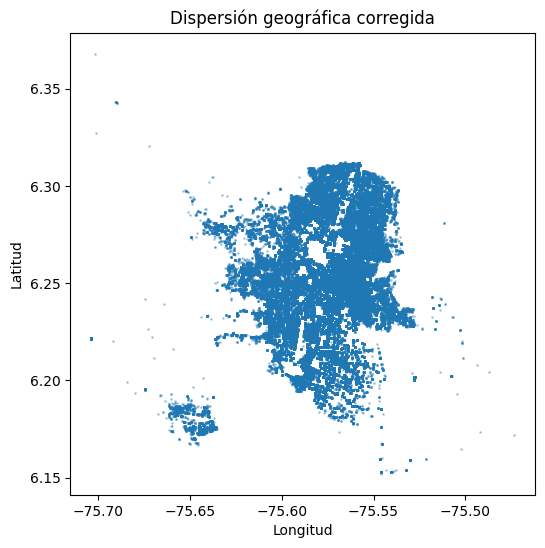

In [ ]:
# Verificar resultado:

plt.figure(figsize=(6,6))
plt.scatter(dataset['Longitud'], dataset['Latitud'], s=1, alpha=0.3)
plt.title('Dispersión geográfica corregida')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.show()

In [ ]:
# Se detecta que 16,498 registros comparten exactamente la misma coordenada (6.2218, -75.7038).
# Resultado de una geocodificación fallida que asignó un punto por defecto. Se eliminan por no representar ubicaciones reales.
mask_default = (dataset['Latitud'].round(4) == 6.2218) & (dataset['Longitud'].round(4) == -75.7038)
dataset = dataset[~mask_default].copy()
dataset.shape

(271950, 15)

In [ ]:
# Eliminar registros sin comuna real (causa raíz de geocodificación fallida)
dataset = dataset[dataset['Comuna'] != 'Sin Inf'].copy()
dataset.shape

(266749, 15)

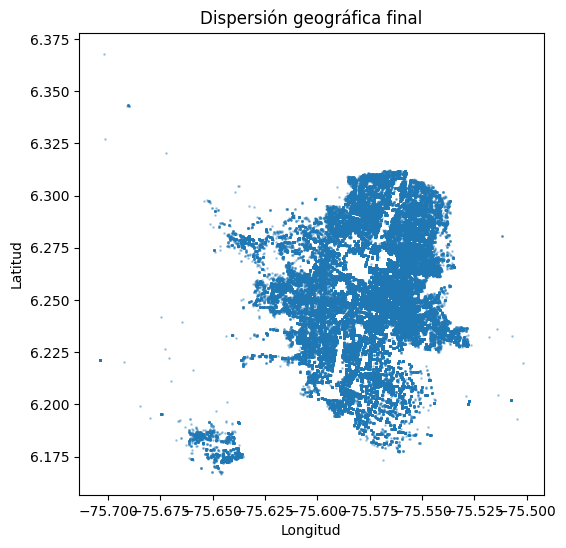

In [ ]:
# Confirmamos mapa limpio
plt.figure(figsize=(6,6))
plt.scatter(dataset['Longitud'], dataset['Latitud'], s=1, alpha=0.3)
plt.title('Dispersión geográfica final')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.show()

## Datos faltantes restantes

In [ ]:
dataset.isnull().sum()

,0
NRO_RADICADO,0
Latitud,0
Longitud,0
CLASE_ACCIDENTE,7
DIRECCION,0
CBML,1343
Gravedad Incidente,0
nombre comuna,0
Barrio,1374
Diseño,729


## Eliminamos e Inputamos para algunos casos


In [ ]:
dataset = dataset.dropna(subset=['CLASE_ACCIDENTE']) # Eliminamos los 7 casos.
dataset['Diseño'] = dataset['Diseño'].fillna('Sin información') # Inputamos
dataset['Barrio'] = dataset['Barrio'].fillna('Sin información') # Inputamos
dataset['CBML'] = dataset['CBML'].fillna('Sin información') # Inputamos
dataset.isnull().sum()
# Confirmamos que ahora el dataset no tiene datos faltantes.

,0
NRO_RADICADO,0
Latitud,0
Longitud,0
CLASE_ACCIDENTE,0
DIRECCION,0
CBML,0
Gravedad Incidente,0
nombre comuna,0
Barrio,0
Diseño,0


# 1.2 - Transformación y creación de variables


### El proyecto también requiere entregar horarios y personal por turno (necesitaremos 'Hora' y 'Franja Horaria'). Estacionalidades y años (necesitaremos 'Mes', 'Año', 'Día Semana'). Al igual que recomendaciones de prevención (necesitaermos 'Clase Accidente', 'Diseño', 'Gravedad')

### Es por eso que debemos hacer una limpieza extensa y profunda del dataset para no tener que retomar con limpieza más adelante

## 1.2.1 - Creación de nuevas variables

## Variables de tiempo

In [ ]:
def extraer_hora(valor):
    if isinstance(valor, datetime.time):
        return valor.hour
    elif isinstance(valor, str):
        try:
            return int(valor.split(':')[0])
        except (ValueError, IndexError):
            return np.nan
    return np.nan

dataset['Hora'] = dataset['HORA_ACCIDENTE'].apply(extraer_hora)

In [ ]:
dataset['Hora'].isnull().sum()
# Observamos 4 registros a los cuales no se les pudo asignar una hora, los eliminamos

np.int64(4)

In [ ]:
dataset = dataset.dropna(subset=['Hora'])
dataset['Hora'] = dataset['Hora'].astype('int64')
dataset['Hora'].isnull().sum()

np.int64(0)

In [ ]:
dataset['Hora'].describe()

,Hora
count,266738.000000
mean,12.601890
std,5.465956
min,0.000000
25%,8.000000
50%,13.000000
75%,17.000000
max,23.000000


In [ ]:
dataset[dataset['Hora'].isnull()][['HORA_ACCIDENTE','CLASE_ACCIDENTE']]

,HORA_ACCIDENTE,CLASE_ACCIDENTE


In [ ]:
dataset = dataset.dropna(subset=['Hora'])
dataset['Hora'] = dataset['Hora'].astype('int64')

In [ ]:
dataset['Hora'].isnull().sum()
dataset.shape

(266738, 16)

## Variables de fechas

In [ ]:
# Se crean variables derivadas de fecha y hora, útiles para el análisis temporal y de clusterización.

# Mes del accidente:
dataset['Mes'] = dataset['FECHA_ACCIDENTE'].dt.month

# Día de la semana:
dataset['Dia_Semana'] = dataset['FECHA_ACCIDENTE'].dt.day_name()

In [ ]:
# Fin de semana
dataset['Fin_de_Semana'] = dataset['Dia_Semana'].isin(['Saturday','Sunday'])

## Franja Horaria

In [ ]:
def franja (hora):
    if 0 <= hora < 6:
      return 'Madrugada'
    elif 6 <= hora < 12:
      return 'Mañana'
    elif 12 <= hora < 18:
      return 'Tarde'
    else:
      return 'Noche'

In [ ]:
dataset['Franja_Horaria'] = dataset['Hora'].apply(franja)

In [ ]:
dataset[['Mes','Dia_Semana','Hora','Franja_Horaria','Fin_de_Semana']].head()

,Mes,Dia_Semana,Hora,Franja_Horaria,Fin_de_Semana
0,1,Wednesday,2,Madrugada,False
1,1,Wednesday,0,Madrugada,False
2,1,Wednesday,1,Madrugada,False
3,1,Wednesday,0,Madrugada,False
4,1,Wednesday,10,Mañana,False


## 1.2.1 - Transformación de nuevas variables

In [ ]:
# Nombre de meses:
meses = {1 : 'Enero', 2 : 'Febrero', 3 : 'Marzo', 4 : 'Abril',
         5 : 'Mayo', 6 : 'Junio', 7 : 'Julio', 8 : 'Agosto',
         9 :'Septiembre', 10 : 'Octubre', 11 : 'Noviembre', 12 : 'Diciembre'}
dataset ['Nombre_Mes'] = dataset['Mes'].map(meses)

In [ ]:
# Días de la semana al español:
dias = {'Monday' : 'Lunes', 'Tuesday' : 'Martes', 'Wednesday' : 'Miércoles', 'Thursday' : 'Jueves',
        'Friday' : 'Viernes', 'Saturday' : 'Sábado', 'Sunday' : 'Domingo'}
dataset['Dia_Semana'] = dataset['Dia_Semana'].map(dias)

In [ ]:
dataset[['Mes','Nombre_Mes','Dia_Semana','Fin_de_Semana']].head()

,Mes,Nombre_Mes,Dia_Semana,Fin_de_Semana
0,1,Enero,Miércoles,False
1,1,Enero,Miércoles,False
2,1,Enero,Miércoles,False
3,1,Enero,Miércoles,False
4,1,Enero,Miércoles,False


# 2 - Exploración preliminar de los datos

## 2.1 - Gráficos de visualización

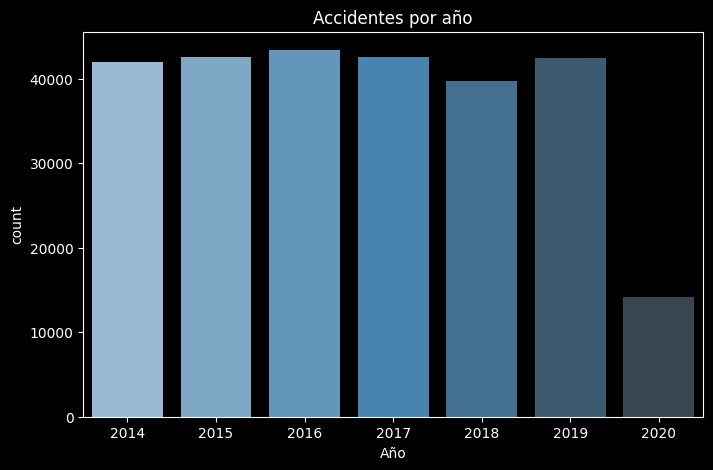

In [158]:
# Accidentes por año
plt.figure(figsize=(8,5))
sns.countplot(data = dataset, x = 'Año', palette = 'Blues_d')
plt.title('Accidentes por año')
plt.show()

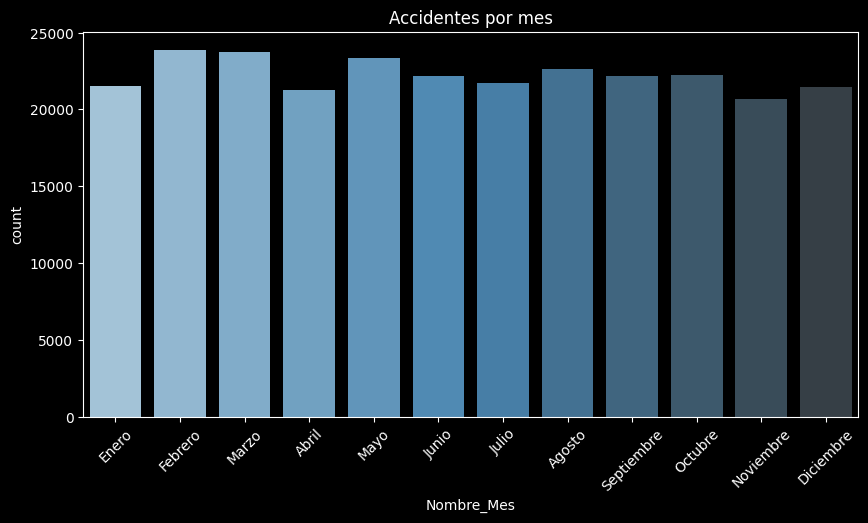

In [157]:
# Accidentes por mes
plt.figure(figsize=(10,5))
orden_meses = ['Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio',
               'Julio', 'Agosto', 'Septiembre', 'Octubre', 'Noviembre', 'Diciembre']

sns.countplot(data = dataset, x = 'Nombre_Mes', order = orden_meses, palette = 'Blues_d')
plt.title('Accidentes por mes')
plt.xticks(rotation = 45)
plt.show()

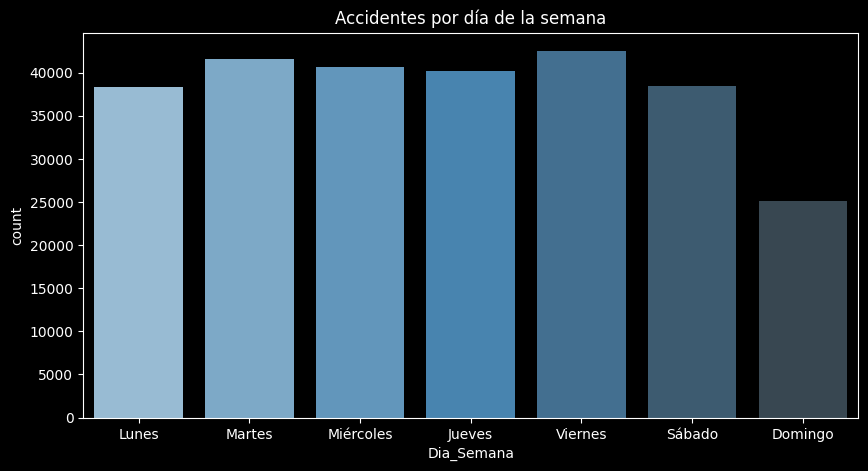

In [156]:
# Accidentes por día de la semana
plt.figure (figsize = (10,5))
orden_dias = ['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo']
sns.countplot(data = dataset, x = 'Dia_Semana', order = orden_dias, palette = 'Blues_d')
plt.title('Accidentes por día de la semana')
plt.show()

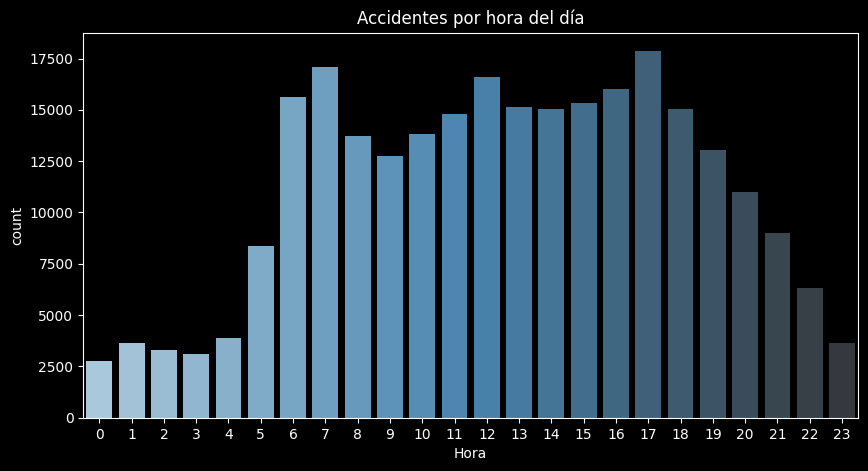

In [155]:
# Accidentes por hora del día
plt.figure(figsize = (10,5))
sns.countplot(data = dataset, x = 'Hora', palette = 'Blues_d')
plt.title('Accidentes por hora del día')
plt.show()

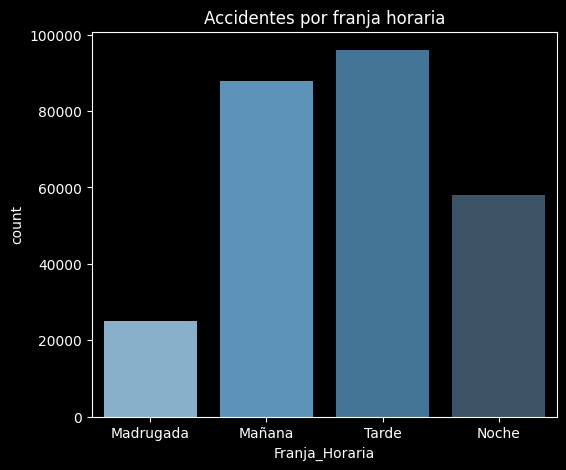

In [154]:
# Accidentes por franja horaria
plt.figure (figsize = (6,5))
sns.countplot(data = dataset, x = 'Franja_Horaria', order = ['Madrugada', 'Mañana', 'Tarde','Noche'], palette = 'Blues_d')
plt.title('Accidentes por franja horaria')
plt.show()

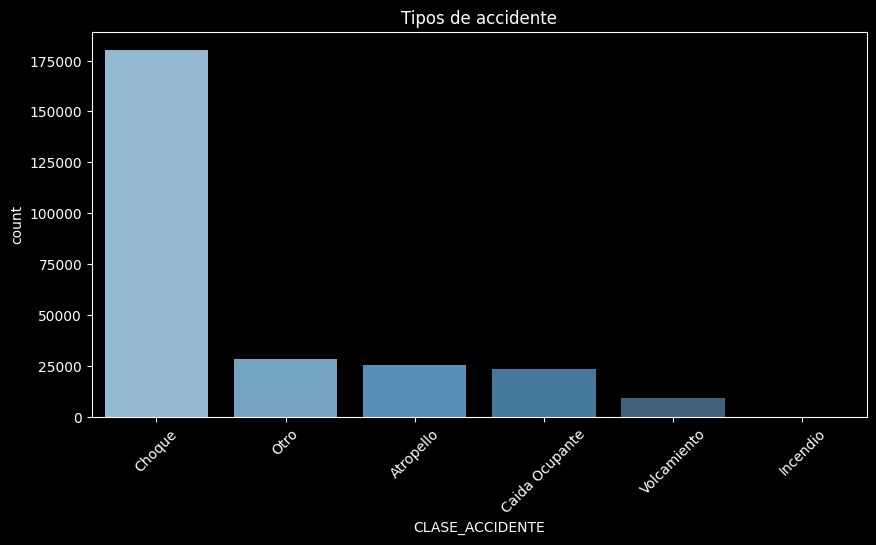

In [153]:
dataset['CLASE_ACCIDENTE'] = dataset['CLASE_ACCIDENTE'].str.strip().str.title()
dataset['CLASE_ACCIDENTE'].unique()

# Tipos de accidente
plt.figure(figsize = (10,5))
sns.countplot(data = dataset, x = 'CLASE_ACCIDENTE', order = dataset['CLASE_ACCIDENTE'].value_counts().index, palette = 'Blues_d')
plt.title('Tipos de accidente')
plt.xticks(rotation = 45)
plt.show()

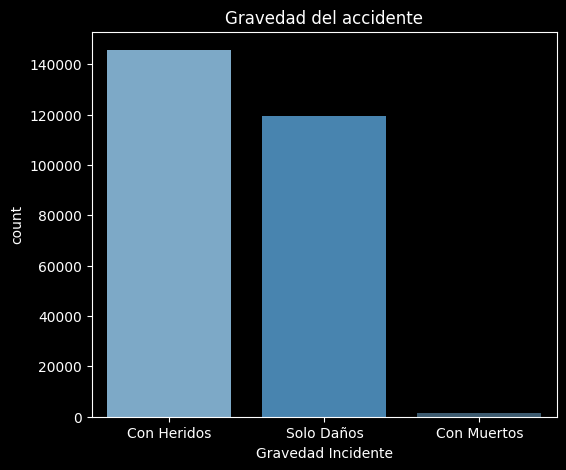

In [152]:
dataset['Gravedad Incidente'] = dataset['Gravedad Incidente'].str.strip().str.title()
dataset['Gravedad Incidente'].unique()

# Gravedad del accidente
plt.figure (figsize = (6,5))
sns.countplot (data = dataset, x = 'Gravedad Incidente', palette = 'Blues_d')
plt.title('Gravedad del accidente')
plt.show()

## Mapa de calor de densidad de accidentes

In [194]:
mapa = folium.Map(
    location=[6.24, -75.58],
    zoom_start=12,
    tiles='https://{s}.basemaps.cartocdn.com/rastertiles/voyager/{z}/{x}/{y}.png?key=cb1_3ixq_1_499bd6e368b55517c5ad58d5',
    attr='&copy; OpenStreetMap contributors, &copy; CARTO'
)

HeatMap(data=dataset[['Latitud','Longitud']], radius=8, blur=6, min_opacity=0.4).add_to(mapa)
mapa

In [197]:
mapa.save("MapaDeCalorAccidentesMedellin.html")

## Matriz de correlación (Variables numéricas relevantes)

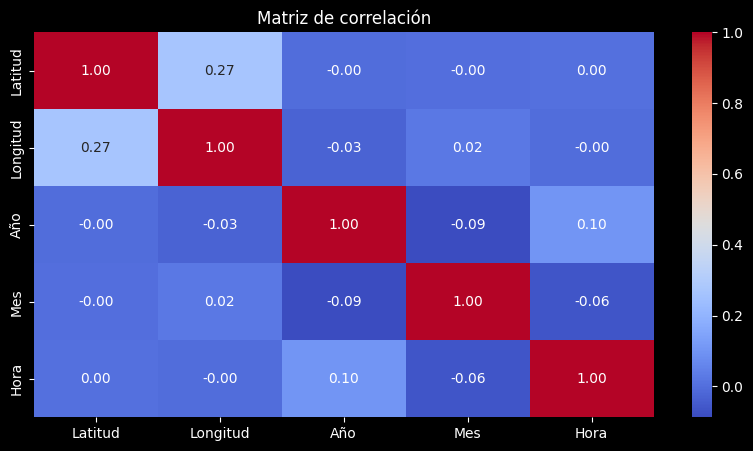

In [150]:
vars_numericas = dataset [['Latitud', 'Longitud', 'Año', 'Mes', 'Hora']]
plt.figure(figsize = (10,5))
sns.heatmap(vars_numericas.corr(), annot = True, cmap = 'coolwarm', fmt = '.2f')
plt.title('Matriz de correlación')
plt.show()

## 2.2 - Descripción de los hallazgos preliminares

## **Hallazgos a nivel de tiempo:**
- Accidentes estables 2014-2019 (~43,000-46,000/año); caída fuerte en 2020, coincide con pandemia y restricciones de movilidad.
- Viernes es el día con más accidentes; domingo el más bajo.
- Pico horario: 6-8am y 4-6pm, coincide con horas pico laborales.
- Franja "Tarde" concentra más accidentes, seguida de "Mañana", de nuevo coincide con horas de ida y regreso laborales.

## **Hallazgos a nivel de tipo de accidente:**
- "Choque" es el tipo dominante (Gran mayoría de los casos).
- Gravedad mayoritaria: "Con heridos" y "Solo daños"; casos "Con muertos" son mínimos (<1%).

## **Hallazgos a nivel geográfico:**
- Mayor densidad en el centro de Medellín y comunas cercanas (La Candelaria, Buenos Aires, Laureles).
- Corredores viales principales (avenidas y vías Metroplús) muestran concentración lineal de accidentes.
- Zonas periféricas (San Antonio de Prado, Santa Elena) tienen menor densidad pero focos puntuales.

## **Implicación para el modelo:**
- Correlación nula entre variables espaciales y temporales, esto confirma que: ubicación (clustering) y tiempo (franjas horarias) deberían analizarse por separado.

# 3 - Desarrollo de modelos


## 3.1 - Selección de variables

### Se seleccionan **latitud** y **longitud** como variables clave para la clusterización espacial, ya que el objetivo es identificar zonas geográficas de concentración de accidentes.

In [ ]:
X = dataset[['Latitud', 'Longitud']].copy()
X.head()

,Latitud,Longitud
0,6.219016,-75.602726
1,6.260009,-75.568185
2,6.264765,-75.549943
3,6.234327,-75.607611
4,6.300243,-75.579644


##  3.2 - Preparación de variables

In [ ]:
# Se escalan las coordenadas para que ambos ejes tengan igual peso en el cálculo de distancias entre modelos.
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled[:5]

array([[-1.08158289, -1.19114812],
       [ 0.35064909,  0.45650144],
       [ 0.51680448,  1.32664677],
       [-0.54661697, -1.42416925],
       [ 1.75633093, -0.09011093]])

In [ ]:
# Creamos una nueva variable donde almacenemos una muestra significativa del dataset inicial para luego usarla en 'silhouette_score'. Con 5000 filas tomaría segundos ejecutar ya que es 57 veces menos cantidad de filas.
# La idea es mantener una cantidad de muestras óptima que no tenga una relación muy alta respecto al dataset inicial, pero tampoco muchas que haga que la ejecución de la evaluación de métricas tome tanto en ejecutar.
X_sample = resample(X_scaled, n_samples = 50000, random_state = 42) # En este caso tomaremos como muestreo unas 50000 entendiendo que es algo cercano a 1/5 o casi 1/6 del muestreo total inicial.

## 3.3 - Modelos analizados


### Se implementan tres modelos de clusterización: K-Means, DBSCAN y Clustering Jerárquico. Se evalúa cada uno con métricas de silhouette y Davies-Bouldin.

# **K-Means**

## Método del codo

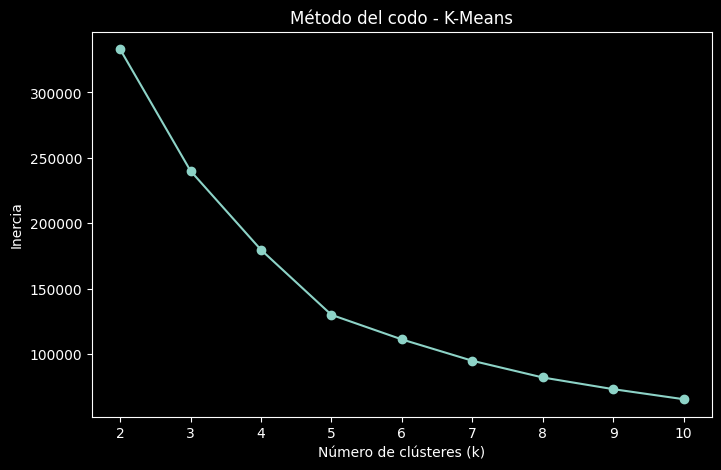

In [149]:
inertias = []
rango_k = range(2,11)

for k in rango_k:
  km = KMeans(n_clusters = k, random_state = 42, n_init = 10)
  km.fit(X_scaled)
  inertias.append(km.inertia_)

plt.figure(figsize = (8,5))
plt.plot(rango_k, inertias, marker = 'o')
plt.xlabel('Número de clústeres (k)')
plt.ylabel('Inercia')
plt.title('Método del codo - K-Means')
plt.show()
# Observamos un claro codo en k = 5. Después de esa cantidad de clústeres se aplana la caída.
# Sin embargo debemos considerar la evaluación de 'silhouette score' donde buscaremos convergencias con esta información obtenida con el método del codo.

## Calificación de la silueta

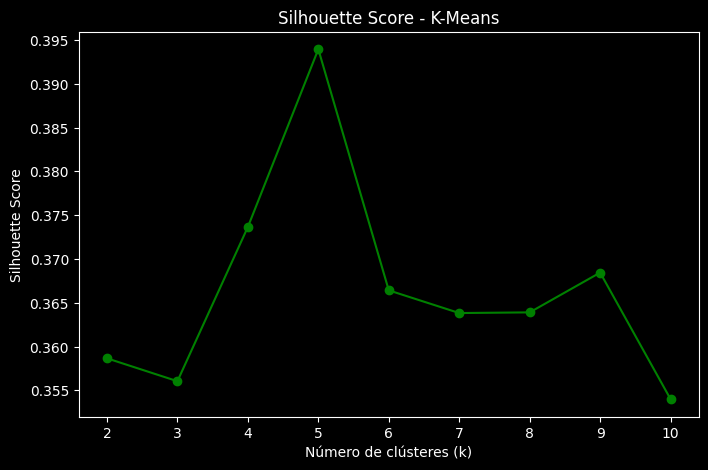

In [148]:
silhouette_scores = []

for k in range (2,11):
  km = KMeans (n_clusters = k, random_state = 42, n_init = 10)
  labels = km.fit_predict(X_sample) # Utilizamos X_sample. Donde tomamos una muestra de 50000 muestras del dataset total con más de 280.000 filas. Cargar todas las filas haría que la ejecución tome demasiado tiempo.
  score = silhouette_score(X_sample, labels)
  silhouette_scores.append(score)

plt.figure(figsize = (8,5))
plt.plot(range(2,11), silhouette_scores, marker = 'o', color = 'green')
plt.xlabel('Número de clústeres (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score - K-Means')
plt.show()
# Observamos que la silueta más alta es en k = 5. Es matemáticamente lo más óptimo sin embargo la calificación está por debajo de 0.50

## K-Means con k = 5

In [198]:
KMk5 = KMeans(n_clusters = 5, random_state = 43, n_init = 10)
dataset['K-Meansk=5'] = KMk5.fit_predict(X_scaled)

In [ ]:
plt.style.use('dark_background')

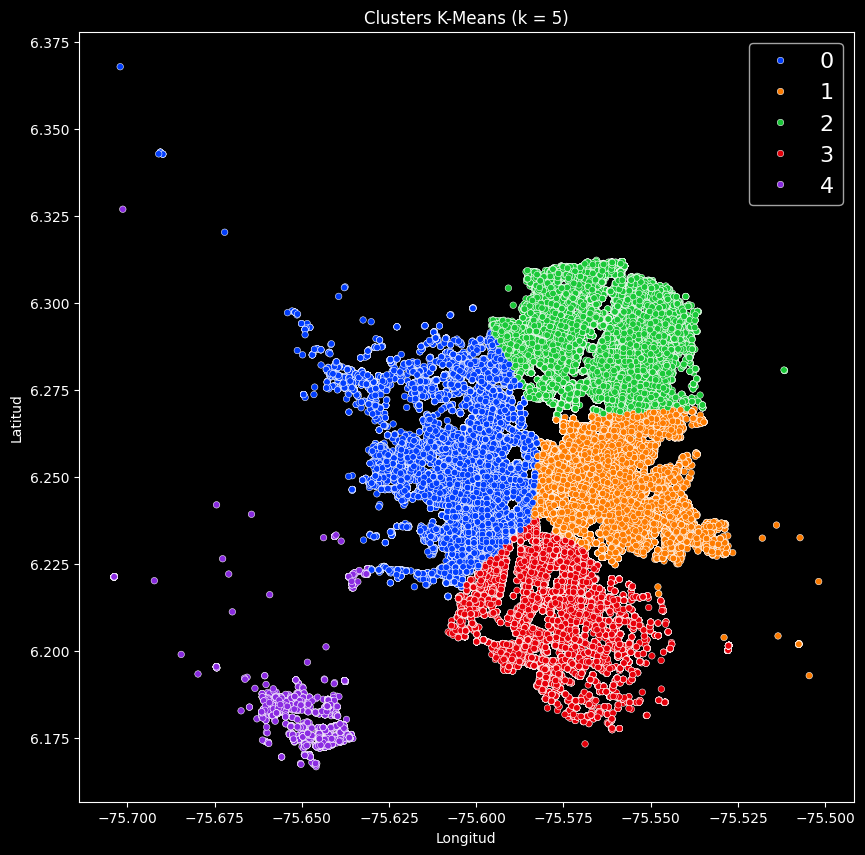

In [161]:
# Visualizamos el módelo con 5 clústeres (k = 5)
plt.figure(figsize = (10,10))
sns.scatterplot(data = dataset, x = 'Longitud', y = 'Latitud', hue = 'K-Meansk=5', palette = 'bright', s = 22, alpha = 0.99)
plt.legend(fontsize=16)
plt.title('Clusters K-Means (k = 5)')
plt.show()
# Vemos 5 Segmentos, 4 principales. Y 1 último bastante más reducido (Cluster 1 de color morado)

In [ ]:
# plt.style.use('default') # Para poner el fondo de las gráficas con matplotlib de color blanco / 'default'

# **DBSCAN**

### DBSCAN agrupa por densidad, no requiere definir número de clusters, y detecta ruido (outliers) automáticamente. Y es útil para identificar zonas de alta concentración real de accidentes.

In [162]:
# Trabaja mejor con distancias reales (metros), no grados escalados. Convertimos a coordenadas proyectadas.

# Usar coordenadas sin escalar para DBSCAN (en grados)
X_DBSCAN = dataset[['Latitud', 'Longitud']].values

# Encontrar epsilon (eps) óptimo con gráfico de distancia k-vecinos
vecinos = NearestNeighbors(n_neighbors = 5) # Definimos como paramétro
vecinos_fit = vecinos.fit(X_DBSCAN)
distancias, indices = vecinos_fit.kneighbors(X_DBSCAN)

distancias = np.sort(distancias[:, 4])

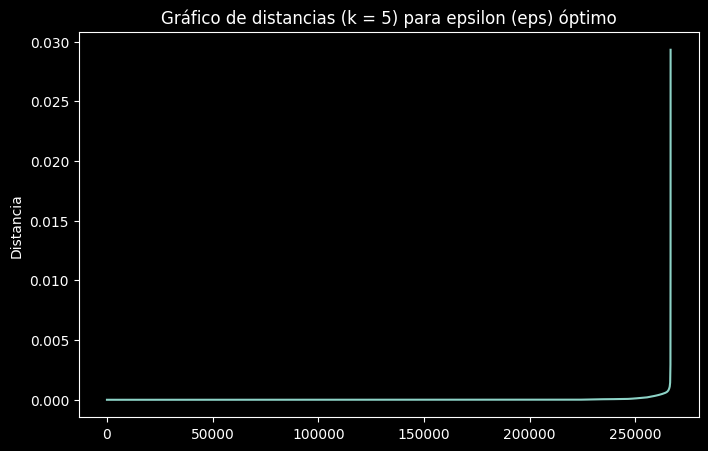

In [163]:
plt.figure(figsize = (8,5))
plt.plot(distancias)
plt.title('Gráfico de distancias (k = 5) para epsilon (eps) óptimo')
plt.ylabel('Distancia')
plt.show()
# Observamos que el codo se sitúa muy al final de la gráfica. Esto puede ser esperado con datos muy densos en el centro (Como vimos previamente en las gráficas con K-Means)

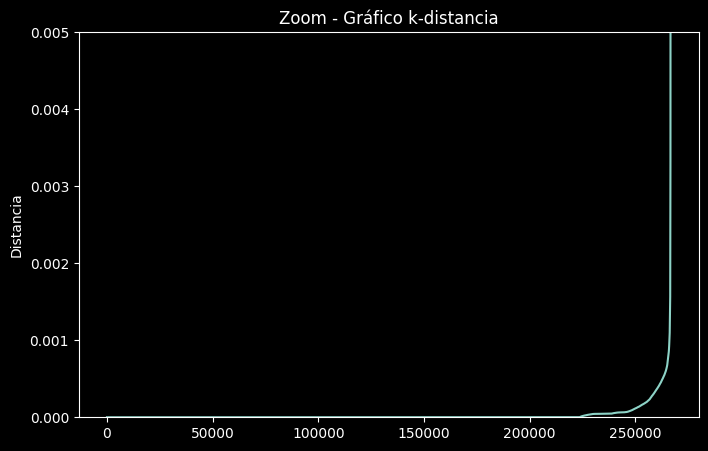

In [164]:
# Hacemos zoom al último tramo para ver mejor el codo:
plt.figure(figsize = (8,5))
plt.plot(distancias)
plt.ylim(0, 0.005)
plt.title('Zoom - Gráfico k-distancia')
plt.ylabel('Distancia')
plt.show()
# Vemos ahora que el codo es más visible. Es fuerte alrededor del índice 270000 a 280000 en distancia apróximada a 0.0005 a 0.001
# eps cercano a 0.0008 es buen punto de partida (equivale a unos 80-90 metros en Medellín).

## Entrenamos el modelo con eps y min_samples óptimo

In [165]:
dbscan = DBSCAN (eps = 0.0015, min_samples = 10)
dataset['Cluster_DBSCAN'] = dbscan.fit_predict(X_DBSCAN)

## Observamos cantidad de clústeres y ruido generados

In [166]:
# Ver cantidad de clústeres:
print(dataset['Cluster_DBSCAN'].nunique())
print(dataset['Cluster_DBSCAN'].value_counts().head(10))

85
Cluster_DBSCAN
 0     253161
 5       2769
 1       1302
 16      1230
 82      1138
 11       997
 8        807
 7        591
-1        357
 13       354
Name: count, dtype: int64


In [167]:
# Teniendo en cuenta que: los clústeres = -1, son ruido:
# Ver cuánto ruido generó
(dataset['Cluster_DBSCAN'] == -1).sum()

np.int64(357)

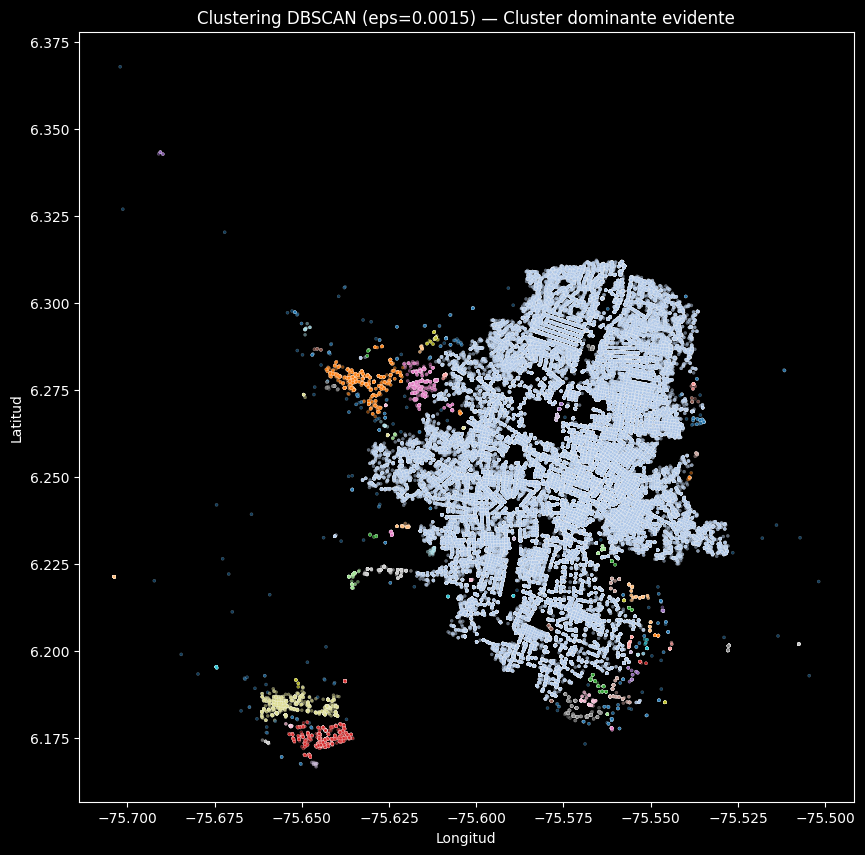

In [171]:
# Gráfico de clusters DBSCAN (usando el mejor eps probado)
plt.figure(figsize=(10,10))
sns.scatterplot(data=dataset, x='Longitud', y='Latitud', hue='Cluster_DBSCAN',
                 palette='tab20', s=5, alpha=0.5, legend=False)
plt.title('Clustering DBSCAN (eps=0.0015) — Cluster dominante evidente')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.show()

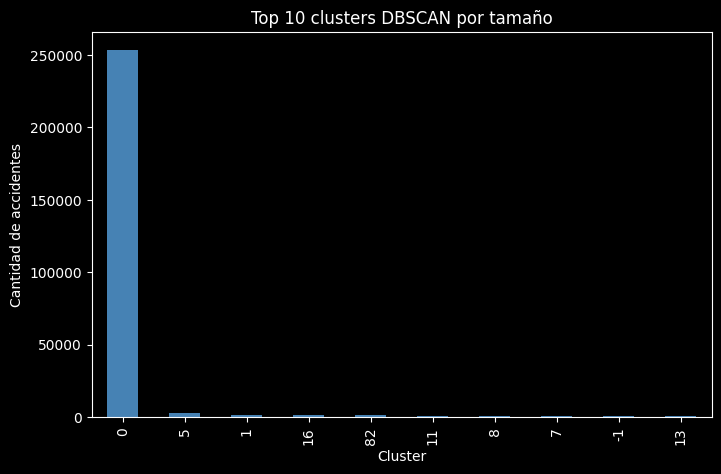

In [173]:
# Gráfico de barras: distribución de tamaño de clusters (evidencia del problema)
conteo_dbscan = dataset['Cluster_DBSCAN'].value_counts().sort_values(ascending=False).head(10)

plt.figure(figsize=(8,5))
conteo_dbscan.plot(kind='bar', color='steelblue')
plt.title('Top 10 clusters DBSCAN por tamaño')
plt.xlabel('Cluster')
plt.ylabel('Cantidad de accidentes')
plt.show()

# Este segundo gráfico es clave para el reporte ya que muestra visualmente cómo un cluster domina desproporcionadamente sobre los demás.

## **Hallazgos con modelo DBSCAN**

Luego de intentar con diferentes valores de eps (en el rango del codo) y n_samples, logro concluir que:

*El modelo DBSCAN NO logra generar una segmentación útil* debido a la zona urbana tan densa como la tenemos en la naturaleza de este dataset.

**¿Por qué puede estar sucediendo esto?**

DBSCAN tiende a fusionar el centro (Ver gráficas de los modelos K-Means implementados para mejor comprensión) en un único cluster masivo. O por otra parte, fragmenta en cientos de micro-clústeres según el eps. Esto sugiere hasta ahora una hipótesis de que los modelos K-Means (ya implementados) y el modelo jerárquico, serían mejores y más eficientes para los efectos prácticos y requerimientos de este proyecto.

*Esto es una limitación del modelo implementado más que una limitación o un problema de los datos y parámetros utilizados.*

**DBSCAN no es adecuado para este dataset porque la densidad urbana es continua, no está agrupada en núcleos separados por espacios vacíos.**

# **Clustering Jerárquico**


### Agrupa por fusiones sucesivas, sin definir k previamente. Útil para visualizar estructura de agrupamiento mediante dendrograma.

In [168]:
print(dataset.shape)
print(X_scaled.shape)

(266738, 24)
(266738, 2)


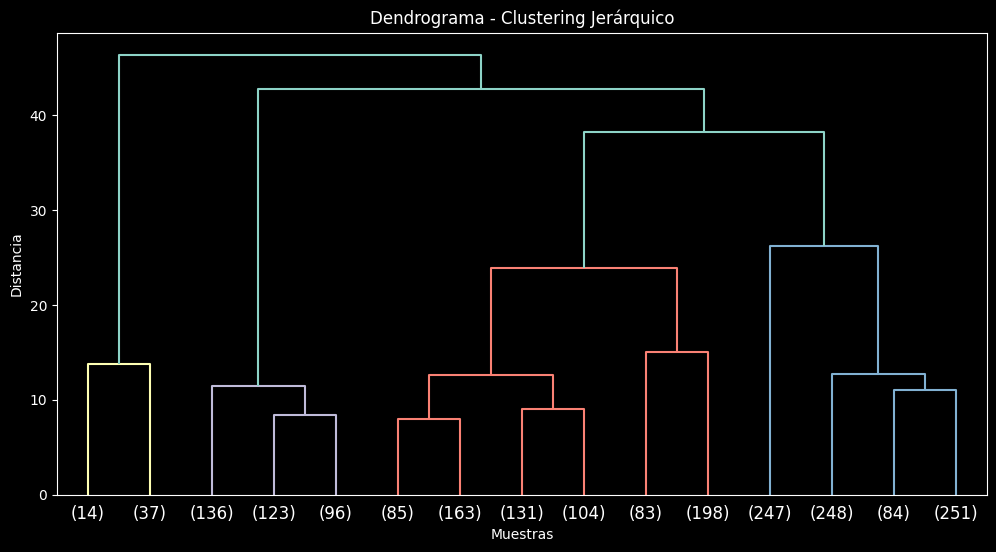

In [169]:
# Con más de 260 mil filas es computacionalmente inviable (dendrograma completo requiere matriz de distancias O(n²)). Usamos muestra.

X_sample_HC = resample(X_scaled, n_samples = 3000, random_state = 42)

linkage_matrix = linkage(X_sample_HC, method = 'ward')

plt.figure(figsize=(12,6))
dendrogram(linkage_matrix, truncate_mode='lastp', p=15)
plt.title('Dendrograma - Clustering Jerárquico')
plt.xlabel('Muestras')
plt.ylabel('Distancia')
plt.show()
# Observamos que la línea horizontal alrededor de distancia 28-30: separa en 4 grupos principales.
# También hay un corte más alto (cerca de 49) que daría solo 2 grandes grupos.
# k=4 es consistente con lo que vimos en K-Means. Aplicamos jerárquico completo con ese valor.

In [174]:
# Tomar muestra manejable para jerárquico
# Con 288000 filas, el clustering jerárquico NO escala bien. Es por esto que tomamos una muestra al igual que como lo hicimos anteriormente para 'Silhouette Score' en K-Means
sample_df = dataset.sample(n=3000, random_state=42).copy()
X_sample_hc = scaler.transform(sample_df[['Latitud','Longitud']])

hc = AgglomerativeClustering(n_clusters=4, linkage='ward')
sample_df['Cluster_HC'] = hc.fit_predict(X_sample_hc)

sample_df['Cluster_HC'].value_counts()

,count
Cluster_HC,
1,1457
0,623
3,495
2,425


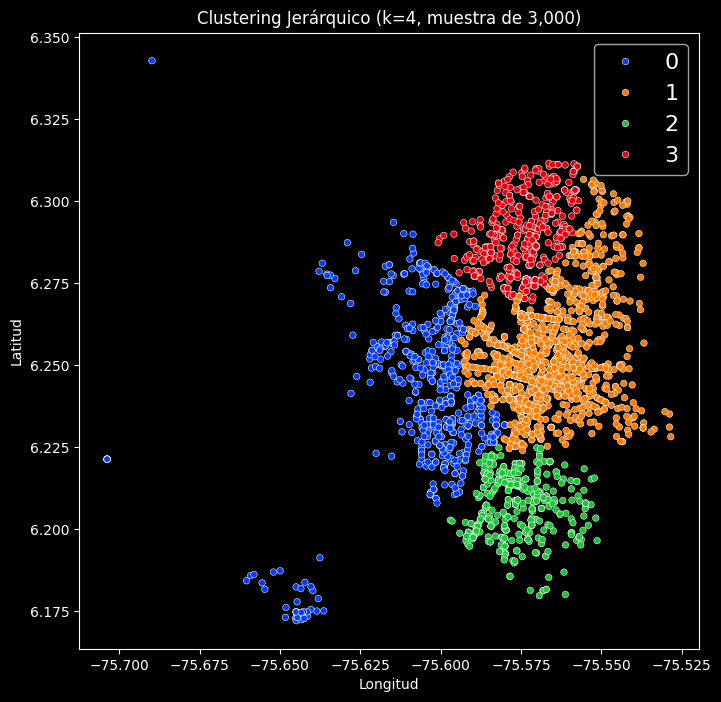

In [175]:
plt.figure(figsize=(8,8))
sns.scatterplot(data=sample_df, x='Longitud', y='Latitud', hue='Cluster_HC', palette='bright', s=22, alpha=0.99)
plt.legend(fontsize=16)
plt.title('Clustering Jerárquico (k=4, muestra de 3,000)')
plt.show()
# Vemos que el resultado es similar al ploteo que obtuvimos con K-Means. Sin embargo observamos que se hace una separación entre el cluster que no permitiría que se pueda implementar de manera operativa.

## Resumen de conteos
Cluster 0 (azul, centro): 1,330
Cluster 2 (verde, sur): 890
Cluster 1 (naranja, norte): 515
Cluster 3 (rojo, aislado): 265


Clustering Jerárquico funciona razonablemente bien, aunque limitado a muestra por RAM.

Ahora tenemos los 3 modelos ejecutados:

1) K-Means (k = 5) — dataset completo, rápido, resultados claros.

2) DBSCAN — dataset completo, pero no logra segmentación útil (un cluster domina).

3) Jerárquico — solo con muestra (limitación RAM), resultados razonables pero no escalable

## 3.4 - Modelo seleccionado y su justificación

## El modelo seleccionado para llevar a cabo el correcto despliegue de unidades de agentes de tránsito y de ambulancias en Medellín, Colombia, es: **K-Means** con 5 clústeres.

## **Por qué?**

### **Escalabilidad:**
#### **K-Means** procesó las 288,970 filas sin problema. Jerárquico solo pudo correr con muestra de 3,000 (limitación de memoria RAM). Aunque DBSCAN sí procesó el dataset completo, no arrojó segmentación útil para el despliegue de recursos de atención.

### **Calidad de segmentación:**
#### **DBSCAN** generó un cluster masivo (88-90% de los datos) sin importar el ajuste del epsilon (eps), por la densidad urbana continua de Medellín. Donde encontramos una zona sin vacíos claros entre ellas. Es por esto que especulamos que el modelo DBSCAN no logra separar grupos significativos.

#### **Clusteing Jerárquico**, aunque con resultados visualmente razonables, depende de una muestra pequeña, lo cual introduce variabilidad y no representa el dataset completo de forma confiable. También cabe recalcar que el modelo usado con 4 clústeres, retorna una gráfica de segmentación muy similar a la obtenida con K-Means con k = 5 también, pero con una gran diferencia a nivel de despliegue. Es por esto que tomamos este modelo de Clustering Jerárquico como una convergencia en la información que refuerza la elección del modelo K-Means

### **Interpretabilidad operativa:**
#### K-Means con k = 5 genera zonas geográficas claras, consistentes con la división real de comunas de Medellín (norte, centro, sur, periferia), directamente aplicables para asignar oficiales de tránsito y ambulancias por zona.


## 3.5 - Presentación de los hallazgos


## Centroides finales del modelo seleccionado (K-Means, k = 5)


In [177]:
# Volver a preparar variables y re-entrenar K-Means con k=6
X = dataset[['Latitud','Longitud']].copy()
X_scaled = scaler.fit_transform(X)

KMk5 = KMeans(n_clusters=5, random_state=42, n_init=10)
dataset['K-Meansk=5'] = KMk5.fit_predict(X_scaled)

dataset['K-Meansk=5'].value_counts()

,count
Con 5 Clústeres,
2,91511
0,60391
4,55944
1,53316
3,5576


In [203]:
centroides_k5 = scaler.inverse_transform(KMk5.cluster_centers_)

resumen_clusters = dataset.groupby('K-Meansk=5').agg(
    Total_Accidentes = ('NRO_RADICADO', 'count'),
    Accidentes_Con_Muertos = ('Gravedad Incidente', lambda x: (x == 'Con Muertos').sum()),
    Hora_Pico = ('Hora', lambda x: x.mode()[0])
).reset_index()

for i, c in enumerate (centroides_k5):
  resumen_clusters.loc[i, 'Latitud_Centro'] = c[0]
  resumen_clusters.loc[i, 'Longitud_Centro'] = c[1]

resumen_clusters

,K-Meansk=5,Total_Accidentes,Accidentes_Con_Muertos,Hora_Pico,Latitud_Centro,Longitud_Centro
0,0,55961,259,7,6.253232,-75.599848
1,1,91528,522,17,6.249201,-75.565956
2,2,60377,364,6,6.286685,-75.567215
3,3,53296,237,17,6.212763,-75.578386
4,4,5576,54,17,6.188250,-75.657646


## Mapa final mostrando los 5 clústeres y sus centroides

In [215]:
mapa_final = folium.Map(
    location=[6.24, -75.58],
    zoom_start=12,
    tiles='https://{s}.basemaps.cartocdn.com/rastertiles/voyager/{z}/{x}/{y}.png?key=cb1_3ixq_1_499bd6e368b55517c5ad58d5',
    attr='&copy; OpenStreetMap contributors, &copy; CARTO'
)

colores = ['red', 'blue', 'green', 'purple', 'orange', 'darkred']

for i, row in dataset.sample(5000, random_state=42).iterrows():
    folium.CircleMarker(
        location=[row['Latitud'], row['Longitud']],
        radius=1,
        color=colores[row['K-Meansk=5']],
        fill=True
    ).add_to(mapa_final)

for i, c in enumerate(centroides_k5):
    folium.Marker(
        location=[c[0], c[1]],
        popup=f"Cluster {i} - Centro",
        icon=folium.Icon(color=colores[i])
    ).add_to(mapa_final)

mapa_final
# Vemos que hay algunos 'outliers' en el mapa.
# Estos puntos representan comunas/corregimientos legítimos con menor densidad de accidentes. Por tanto, es información útil para el reporte ya que esas zonas también necesitan cobertura, aunque con menos frecuencia.

In [196]:
mapa_final.save("ZonasParaMonitorearAccidentesMedellín.html")

# 4 - Informe ejecutivo de los hallazgos

# **Dónde ubicar los recursos**
## Teniendo en cuenta que el cluster con mayor cantidad de accidentes es el 1: Ubicar mayor presencia de agentes de tránsito en este segmento de la ciudad.

## Para las ambulancias las podríamos asignar en el centroide de cada zona. De esta manera aseguramos una distribución y distancia equitativa para cada caso de emergencia

## San Antonio de Prado (Cluster 3) necesita una unidad asilada que se enfoque única y dedicadamente en esta zona, esto debido a que se encuentra aislada geográficamente

# **Horarios y personal**

## Las horas pico entre las  4 y 6 de la tarde, necesitan un refuerzo de personal. Encontramos una convergencia en el índice 2.1 - Gráficos de visualización. Son estas las horas con mayor cantidad de accidentes. Se podría sugerir enviar a practicantes o trabajadores de medio turno para que refuercen esos horarios en las múltiples zonas de cada cluster.

## Turno secundario 6-8 de la mañana. Es el segundo pico de franja horaria donde se presentan mayor cantidad de accidentes.

## Finalmente la franja horaria donde menos accidentes se presentan es en la madrugada. Se pueden retirar y prescindir de unidades en estos horarios.

# **Estacionalidad**

## Notamos una estabilidad en cantidad de accidentes por año desde 2014 a 2019. La caída que notamos en 2020 es convergente con la restricción de movilidad de la pandemia

## El viernes es sin duda el día más crítico, es cuando más accidentes se presentan en términos generales. Por contrario, el domingo, es el día en que menos accidentes se presentan. Esta información es sumamente útil y relevante para la distribución de horarios y de refuerzos para agentes de tránsito y para demás personal posiblemente requerido.

## No encontramos una variación notable por meses. Se mantiene una cantidad promedio todos los meses

# **Prevención**

## Los choques son el tipo de accidente que predomina. Esto permite plantear una hipótesis o una estrategia de monitoreo que permita determinar la calidad de señalización vial cercanas a las latitudes y longitudes con mayor cantidad de incidentes. Para esto podríamos usar como referencia los accidentes más graves, como los clústeres donde se presenten accidentes con heridos. Reforzando así el ploteo realizado que mostraba que son los más frecuentes.

##  Entender qué está pasando en latitudes y longitudes cercanas en un rango establecido, es clave para comprender si los accidentes son causados por exceso de velocidad, mala señalización, 'puntos ciegos', u otras posibles circunstancias que puedan fomentar un posible incidente.

## Ej: Sin variable de tráfico o densidad poblacional. Un cluster con muchos accidentes puede ser simplemente una zona de alto tránsito, no necesariamente peligrosa por diseño vial. Es por eso que recalco la importancia de seguir indagando presencialmente en las calles para dar un aval propio.

# **Limitaciones de la estructura del código y del modelo escogido**

## Muchos casos no presentaban información de la calle, municipio o CBML. Esto resultó en tener que descartar datos que si bien no representaban una gran muestra del total de datos, se descartaron sin saber qué cualificación pudo haber generado estos incidentes

## Respecto al modelo, bien elegimos K-Means por *escalabilidad* sobre DBSCAN y HC. Los clústeres son basados meramente en coordenadas, ignoran el tipo de vía donde se presenta el incidente.

## Dos accidentes cercanos en línea recta pueden estar en vías totalmente distintas (autopista vs. calle local).

## **Recomendación estructural:** replicar este modelo trimestralmente. Los clusters no son estáticos — nuevas vías, semáforos o crecimiento urbano pueden desplazar zonas críticas con el tiempo.

## Finalmente, la elección de k = 5 fue elegida meramente por efectos prácticos más que por un valor de métrica meramente. Sin embargo observando propiamente la gráfica (Ver índice K-Means - Calificación de la silueta) donde vemos que k = 5 tiene la mayor calificación y es prácticamente viable para la implementación y la finalidad de este proyecto

# **Hipotésis planteadas luego de los hallazgos**

## Clústeres 1 y 2 (Norte y Centro-Oriente) concentran la mayor cantidad de accidentes. Se podría priorizar en estas zonas pues, el primer despliege de recursos más pronto esperando mayor retorno inmediato.

## Hora pico coincide con jornada laboral (6-8am, 5-7pm), no con ocio nocturno. Sugiere que el problema es movilidad diaria en lugar de pensarse en  casos de conducción bajo efectos de embriaguez.

## Son los días viernes los más críticos sin duda, no en fines de semana       -> Hipótesis: acumulación de tráfico de cierre de semana laboral + salidas nocturnas de viernes, doble exposición al riesgo en un mismo día.

## San Antonio de Prado con proporción de muertes más alta pese a bajo volumen -> Hipótesis: vías rurales/periféricas con menor infraestructura de seguridad (menos semáforos, menos iluminación) generan accidentes menos frecuentes pero más graves. Sería clave contar con unidades de ambulancia y de atención médica preparadas activamente.

## Caída de accidentes en 2020 no es mejora real de seguridad vial, es efecto externo (pandemia)


# Apoyo visual para las conclusiones finales

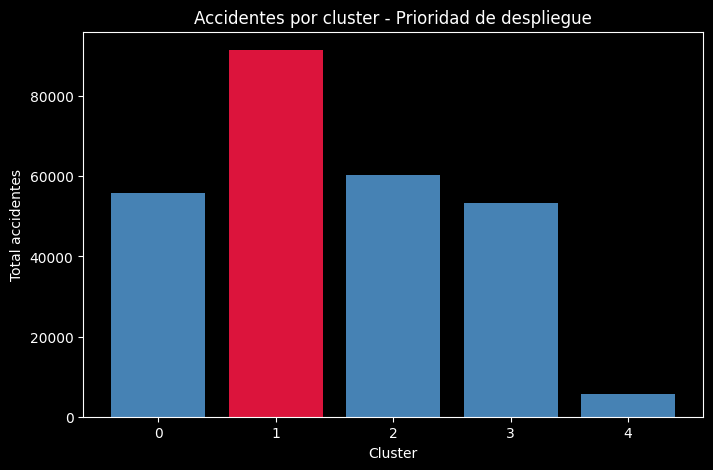

In [208]:
# 1. Accidentes por cluster - prioridad de recursos
plt.figure(figsize=(8,5))
cluster_max = resumen_clusters.loc[resumen_clusters['Total_Accidentes'].idxmax(), 'K-Meansk=5']
colores_bar = ['crimson' if i==cluster_max else 'steelblue' for i in resumen_clusters['K-Meansk=5']]
plt.bar(resumen_clusters['K-Meansk=5'].astype(str), resumen_clusters['Total_Accidentes'], color=colores_bar)
plt.title('Accidentes por cluster - Prioridad de despliegue')
plt.xlabel('Cluster')
plt.ylabel('Total accidentes')
plt.show()

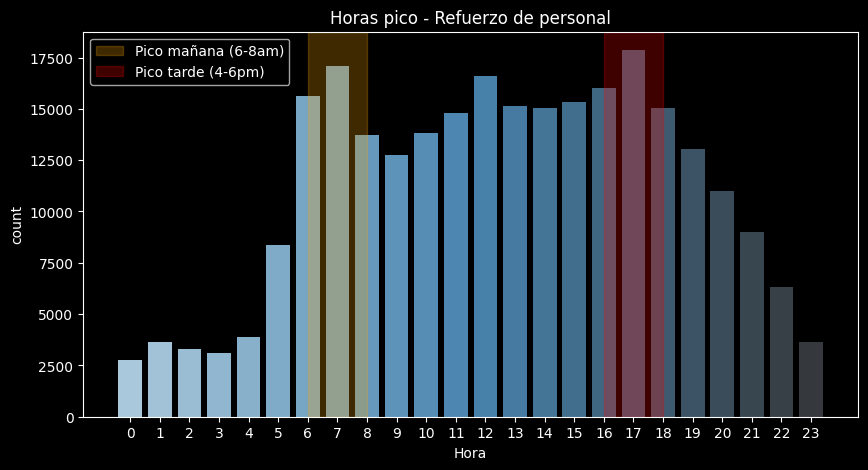

In [209]:
# 2. Horas pico - refuerzo de personal
plt.figure(figsize=(10,5))
sns.countplot(data=dataset, x='Hora', palette='Blues_d')
plt.axvspan(6, 8, color='orange', alpha=0.25, label='Pico mañana (6-8am)')
plt.axvspan(16, 18, color='red', alpha=0.25, label='Pico tarde (4-6pm)')
plt.title('Horas pico - Refuerzo de personal')
plt.legend()
plt.show()

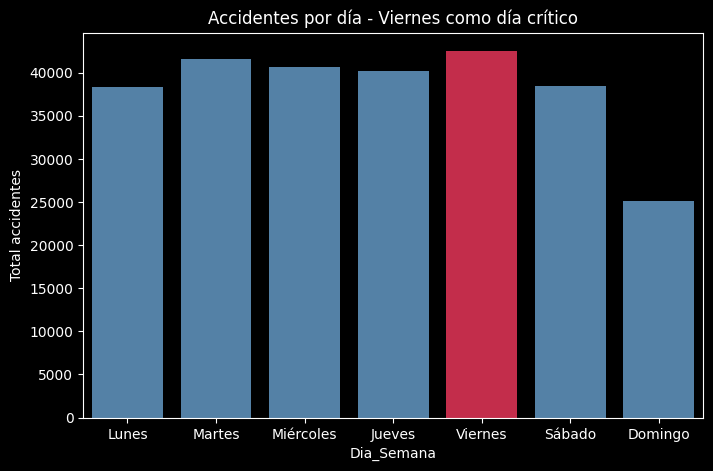

In [200]:
# 3. Accidentes por día - Viernes crítico
plt.figure(figsize=(8,5))
orden_dias = ['Lunes','Martes','Miércoles','Jueves','Viernes','Sábado','Domingo']
colores_dias = ['crimson' if d=='Viernes' else 'steelblue' for d in orden_dias]
sns.barplot(data=dataset, x='Dia_Semana', y=[1]*len(dataset), estimator=sum,
            order=orden_dias, palette=colores_dias, errorbar=None)
plt.title('Accidentes por día - Viernes como día crítico')
plt.ylabel('Total accidentes')
plt.show()

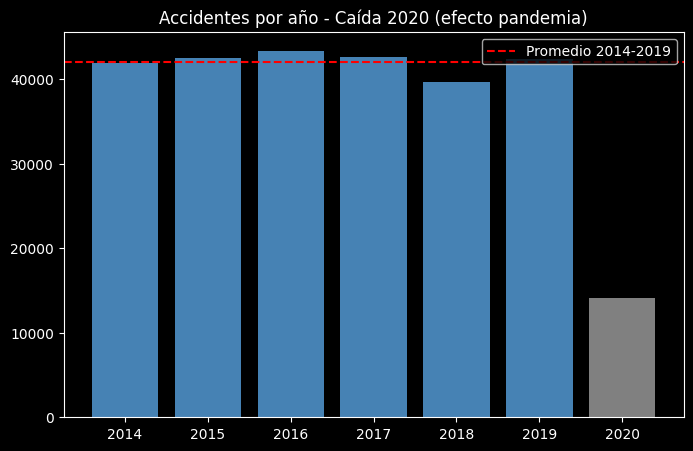

In [210]:
# 4. Accidentes por año - efecto pandemia 2020
plt.figure(figsize=(8,5))
conteo_anio = dataset['Año'].value_counts().sort_index()
colores_anio = ['gray' if a==2020 else 'steelblue' for a in conteo_anio.index]
plt.bar(conteo_anio.index.astype(str), conteo_anio.values, color=colores_anio)
plt.axhline(y=conteo_anio[conteo_anio.index<2020].mean(), color='red', linestyle='--', label='Promedio 2014-2019')
plt.title('Accidentes por año - Caída 2020 (efecto pandemia)')
plt.legend()
plt.show()

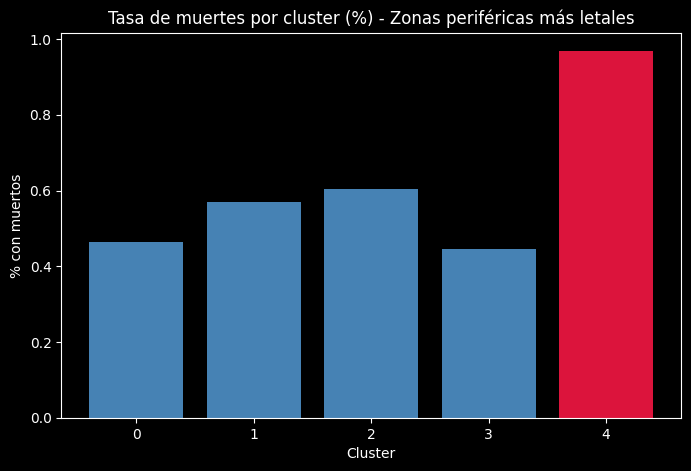

In [211]:
# 5. Tasa de muertes por cluster - San Antonio de Prado
resumen_clusters['Tasa_Muertes_%'] = (
    resumen_clusters['Accidentes_Con_Muertos'] / resumen_clusters['Total_Accidentes'] * 100
)
plt.figure(figsize=(8,5))
tasa_max = resumen_clusters['Tasa_Muertes_%'].max()
colores_tasa = ['crimson' if v==tasa_max else 'steelblue' for v in resumen_clusters['Tasa_Muertes_%']]
plt.bar(resumen_clusters['K-Meansk=5'].astype(str), resumen_clusters['Tasa_Muertes_%'], color=colores_tasa)
plt.title('Tasa de muertes por cluster (%) - Zonas periféricas más letales')
plt.xlabel('Cluster')
plt.ylabel('% con muertos')
plt.show()

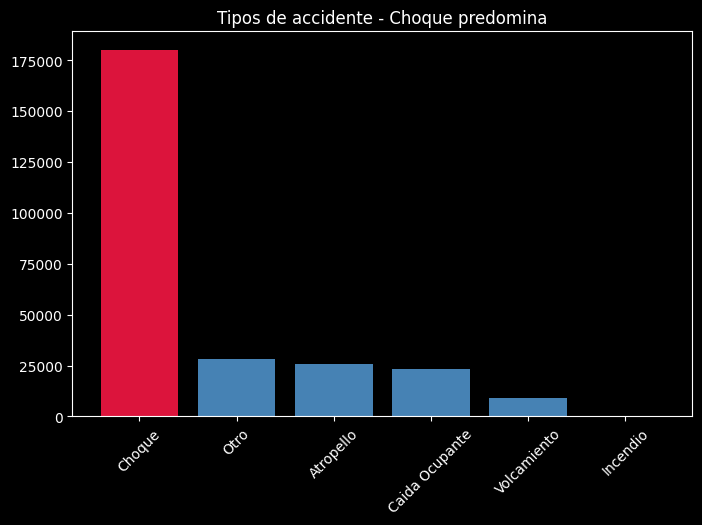

In [212]:
# 6. Tipos de accidente - prevención vial
plt.figure(figsize=(8,5))
conteo_tipo = dataset['CLASE_ACCIDENTE'].value_counts()
colores_tipo = ['crimson' if t=='Choque' else 'steelblue' for t in conteo_tipo.index]
plt.bar(conteo_tipo.index, conteo_tipo.values, color=colores_tipo)
plt.title('Tipos de accidente - Choque predomina')
plt.xticks(rotation=45)
plt.show()

In [219]:
# 7. Mapa final con ambulancias en centroides
mapa_ambulancias = folium.Map(
    location=[6.24, -75.58], zoom_start=12,
    tiles='https://{s}.basemaps.cartocdn.com/rastertiles/voyager/{z}/{x}/{y}.png?key=cb1_3ixq_1_499bd6e368b55517c5ad58d5',
    attr='&copy; OpenStreetMap contributors, &copy; CARTO'
)
for i, c in enumerate(centroides_k5):
    folium.Marker(
        location=[c[0], c[1]],
        popup=f"Ambulancia - Cluster {i}",
        icon=folium.Icon(color='red', icon='plus-sign')
    ).add_to(mapa_ambulancias)

mapa_ambulancias

In [ ]:
mapa_ambulancias.save('UbicacionesOptimasParaAmbulancias.html')